In [2]:
import sys
import os
sys.path = [p for p in sys.path if "ParaView" not in p]
sys.path.append("/home/haseeb/Notebooks/Parametric_DMD_cylinder_2D_modules")



import torch as pt
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.tri as mtri
from flowtorch import DATASETS
from flowtorch.data import FOAMDataloader, mask_box
from pydmd import DMD, HODMD, ParametricDMD
from ezyrb import POD, Database, RBF, GPR, Linear
import seaborn as sns


from pathlib import Path
import re
# For High Quality Visuals
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 160  # crisp visuals


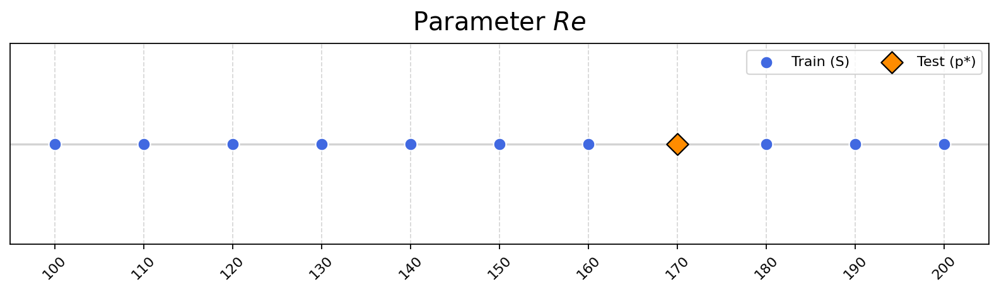

In [3]:
# Training and test parameters (parameter set P and test parameter μ*)

# Training parameter set P = {μ1, ..., μP}, i.e., Reynolds numbers
Re_list = np.array([100, 110, 120, 130, 140, 150, 160, 180, 190, 200])  # μ: training parameters

# Test parameter μ* (unseen Reynolds number)
Re_test = 170  # μ*: test parameter
# Global reference length and viscosity
L_ref = 0.1   # cylinder diameter [m]
nu = 1e-3     # kinematic viscosity [m^2/s] (example value, adjust to your case)

# Geometry parameters (from your blockMeshDict)
cylinderX = 0.2   # cylinder center x [m]
cylinderY = 0.2   # cylinder center y [m]
radius    = 0.05  # cylinder radius [m]


# Calculate reference velocities for non-dimensionalization directly from Re
U_ref_dict = {Re: Re * nu / L_ref for Re in Re_list}
U_ref_test = Re_test * nu / L_ref

# Visualization of parameter set S and test parameter p*
fig, ax = plt.subplots(figsize=(10, 3))
plt.title('Parameter $Re$', fontsize=18, pad=10)

# Plot all training parameters (S)
ax.scatter(Re_list, np.zeros_like(Re_list), 
           marker='o', s=80, color='royalblue', edgecolor='white', 
           label='Train (S)', zorder=3)

# Plot test parameter (p*)
ax.scatter(Re_test, 0, 
           marker='D', s=120, color='darkorange', edgecolor='black', 
           label='Test (p*)', zorder=4)

# Formatting
plt.xticks(np.append(Re_list, Re_test), rotation=45, fontsize=10)
plt.yticks([])
ax.axhline(0, color='lightgray', linewidth=1.5, zorder=1)   # baseline line
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.legend(ncols=2, frameon=True, fontsize=10)

plt.tight_layout()
plt.show()

In [4]:
# Load and prepare data

from data_loader import load_all_snapshots, load_test_parameter

# Base folder containing simulation data
base_path = os.path.expanduser("~/OpenFOAM/test_1")


# Time windows
training_window = (10.0, 15.0)  # Time range for training snapshots
future_window = (15.0, 20.0)    # Time range for future prediction
test_window = (15.0, 20.0)       # Time range for test Reynolds number

# Sampling step for downsampling time steps
sampling_step = 1

# Load training and future snapshots for all training Reynolds numbers
data = load_all_snapshots(
    Re_list=Re_list,
    base_path=base_path,
    mask_box=mask_box,
    FOAMDataloader=FOAMDataloader,
    training_window=training_window,
    future_window=future_window,
    sampling_step=sampling_step
)

# Access training data
snapshot_dict = data["snapshot_dict"]
sampled_times_dict = data["sampled_times_dict"]
snapshot_future_dict = data["snapshot_future_dict"]
sampled_times_future_dict = data["sampled_times_future_dict"]
masked_coords_dict = data["masked_coords_dict"]        
num_points_dict = data["num_points_dict"]              

# Load test snapshots for an unseen Reynolds number
path_test = f"{base_path}/cylinder_2D_Re{Re_test}"
snapshot_test, num_points_test, times_test, mask_test, coords_test, loader_test = load_test_parameter(
    Re=Re_test,
    path=path_test,
    mask_box=mask_box,
    FOAMDataloader=FOAMDataloader,
    time_window=test_window,
    sampling_step=sampling_step
)




[2026-03-09 21:53:56] INFO     Loading precomputed cell centers and volumes from processor0/constant
[2026-03-09 21:53:56] INFO     Loading precomputed cell centers and volumes from processor1/constant


Re=100: Masked points = 5746
Re=110: Masked points = 5746
Re=120: Masked points = 5746
Re=130: Masked points = 5746
Re=140: Masked points = 5746
Re=150: Masked points = 5746
Re=160: Masked points = 5746
Re=180: Masked points = 5746
Re=190: Masked points = 5746
Re=200: Masked points = 5746
All snapshots loaded.


[2026-03-09 21:54:30] INFO     Loading precomputed cell centers and volumes from processor0/constant
[2026-03-09 21:54:30] INFO     Loading precomputed cell centers and volumes from processor1/constant


Test Re=170: Loaded snapshot shape = (11492, 501)


In [5]:
# Confirm shapes of loaded data

for Re in Re_list:
    print(f"Re={Re}, shape={snapshot_dict[Re].shape}")


Re=100, shape=(11492, 501)
Re=110, shape=(11492, 501)
Re=120, shape=(11492, 501)
Re=130, shape=(11492, 501)
Re=140, shape=(11492, 501)
Re=150, shape=(11492, 501)
Re=160, shape=(11492, 501)
Re=180, shape=(11492, 501)
Re=190, shape=(11492, 501)
Re=200, shape=(11492, 501)


/home/haseeb/Notebooks/Parametric_DMD_cylinder_2D_modules/visualization_utilities.py:34: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=16)


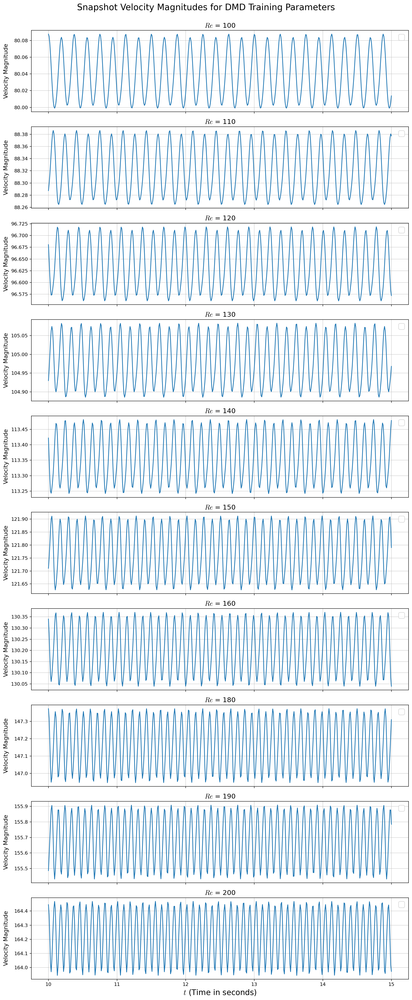

In [6]:
# Snapshot magnitude over time for each Parameter i.e., Reynolds number

from visualization_utilities import plot_snapshot_magnitudes

loader_dict = data["loader_dict"]  

plot_snapshot_magnitudes(snapshot_dict, sampled_times_dict, Re_list)


In [7]:
# Add noise to training parameters snapshots

from noise_analysis_paramdmd import add_noise_to_snapshots

# Choose noise level(s)
noise_levels = [0, 10, 20, 40]  # or any subset you want

snapshot_noisy_dict_versions = {}

for nl in noise_levels:
    snapshot_noisy_dict_versions[nl] = add_noise_to_snapshots(
        snapshot_dict=snapshot_dict,
        Re_list=Re_list,
        noise_level=nl
    )


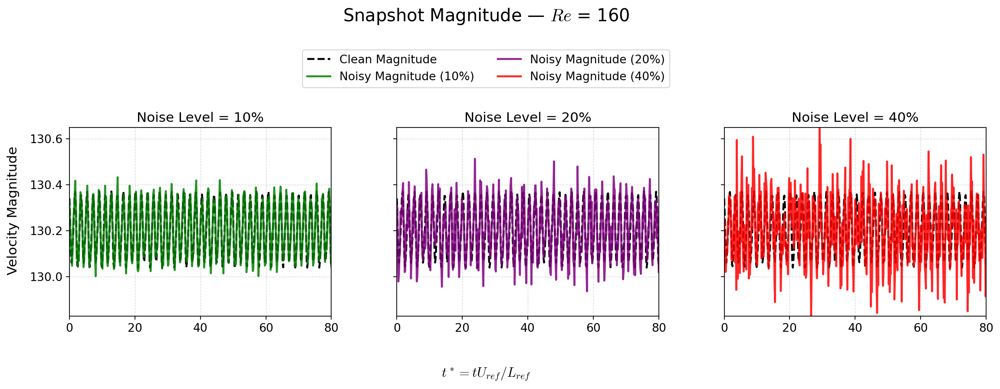

In [8]:
# Visualize added noise

from noise_analysis_paramdmd import visualize_noise_levels

Re_vis = 160
noise_levels = [10, 20, 40]
colors = {0: "royalblue", 10: "green", 20: "purple", 40: "red"}

visualize_noise_levels(
    snapshot_noisy_dict_versions=snapshot_noisy_dict_versions,
    snapshot_clean=snapshot_dict[Re_vis],
    sampled_times_dict=sampled_times_dict,
    Re_value=Re_vis,
    noise_levels=noise_levels,
    colors=colors,
    U_ref_dict=U_ref_dict,
    L_ref=L_ref
)




## Preprocess training snapshots: Subtract mean flow

In [9]:
from preprocess_snapshots import preprocess_snapshots

snapshot_noisy_processed_dict = {}
mean_flow_noisy_dict = {}   

for nl in noise_levels:
    print(f"\nPreprocessing noise level {nl}%")

    # Preprocess training datasets for noise level
    train_snapshots, mean_flow_train, snapshot_processed_dict = preprocess_snapshots(
        snapshot_noisy_dict_versions[nl],
        Re_list=Re_list
    )

    # Store processed snapshots
    snapshot_noisy_processed_dict[nl] = snapshot_processed_dict

    # Store mean flow for this noise level
    mean_flow_noisy_dict[nl] = mean_flow_train

    # Print shapes of preprocessed data
    print("Training mean flow shape:", mean_flow_train.shape)
    print("Training snapshot array shape:", train_snapshots.shape)

    for Re in Re_list:
        print(f"Noise {nl}% | Re={Re}: processed shape = {snapshot_processed_dict[Re].shape}")



Preprocessing noise level 10%
Training mean flow shape: (11492,)
Training snapshot array shape: (10, 11492, 501)
Noise 10% | Re=100: processed shape = (11492, 501)
Noise 10% | Re=110: processed shape = (11492, 501)
Noise 10% | Re=120: processed shape = (11492, 501)
Noise 10% | Re=130: processed shape = (11492, 501)
Noise 10% | Re=140: processed shape = (11492, 501)
Noise 10% | Re=150: processed shape = (11492, 501)
Noise 10% | Re=160: processed shape = (11492, 501)
Noise 10% | Re=180: processed shape = (11492, 501)
Noise 10% | Re=190: processed shape = (11492, 501)
Noise 10% | Re=200: processed shape = (11492, 501)

Preprocessing noise level 20%
Training mean flow shape: (11492,)
Training snapshot array shape: (10, 11492, 501)
Noise 20% | Re=100: processed shape = (11492, 501)
Noise 20% | Re=110: processed shape = (11492, 501)
Noise 20% | Re=120: processed shape = (11492, 501)
Noise 20% | Re=130: processed shape = (11492, 501)
Noise 20% | Re=140: processed shape = (11492, 501)
Noise 2

## Partitioned ParametericDMD from PyDMD 

#### References

[Ichinaga et al., *PyDMD: A Python Package for Robust Dynamic Mode Decomposition*, JMLR 2024 — GitHub](https://github.com/mathLab/PyDMD)




## Offline Phase

## Step 1: Perform POD and DMD on the concatenated snapshot matrix X1

In [10]:
# Parametric DMD

pdmd_models = {}
rom_models = {}   

for nl in noise_levels:
    print(f"\n Training PDMD for noise level {nl}% ")

    # Create shared POD basis
    rom = POD(rank=30, method="randomized_svd")

    # Create DMD instances
    trained_dmds = [DMD(svd_rank=-1) for _ in Re_list]

    # Create interpolator
    interpolator = RBF()

    # Construct ParametricDMD
    pdmd = ParametricDMD(trained_dmds, rom, interpolator)

    # Build training tensor for the noise level
    train_snapshots_noisy = np.array([
        snapshot_noisy_processed_dict[nl][Re] for Re in Re_list
    ])

    # Fit model
    pdmd.fit(train_snapshots_noisy, np.array(Re_list).reshape(-1, 1))

    # Store the model and rom
    pdmd_models[nl] = pdmd
    rom_models[nl] = rom






 Training PDMD for noise level 10% 


[2026-03-09 21:54:44] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:44] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:44] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:44] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:44] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:44] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:44] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:44] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:44] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:44] INFO     Snapshots: (30, 501), snapshot shape: (30,)



 Training PDMD for noise level 20% 


[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)



 Training PDMD for noise level 40% 


[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)
[2026-03-09 21:54:45] INFO     Snapshots: (30, 501), snapshot shape: (30,)


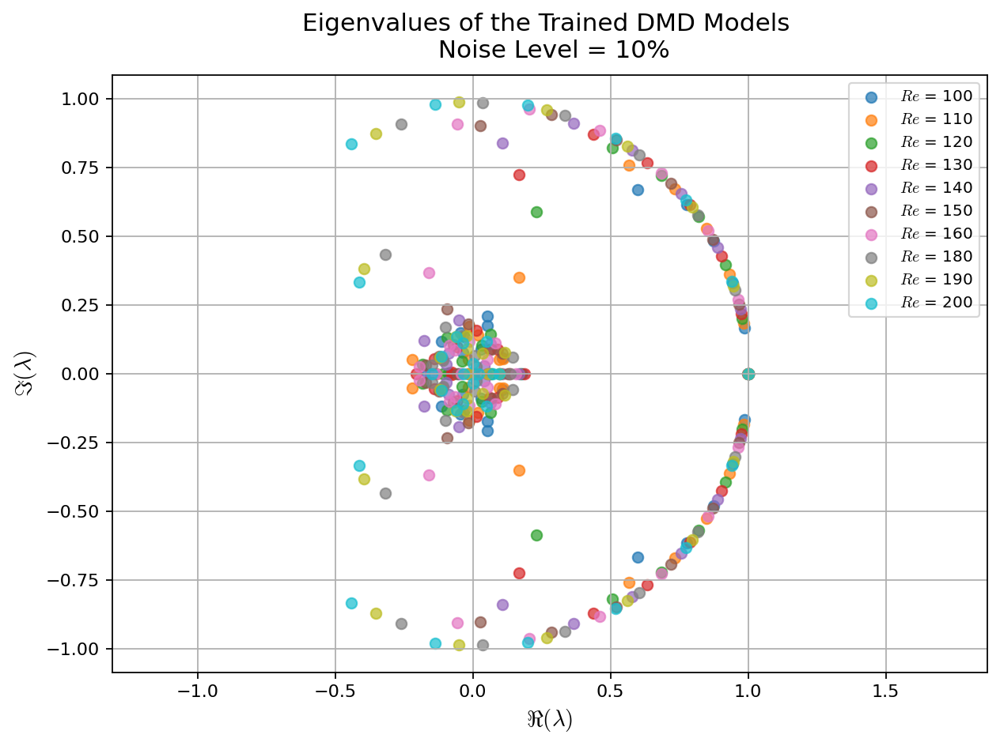

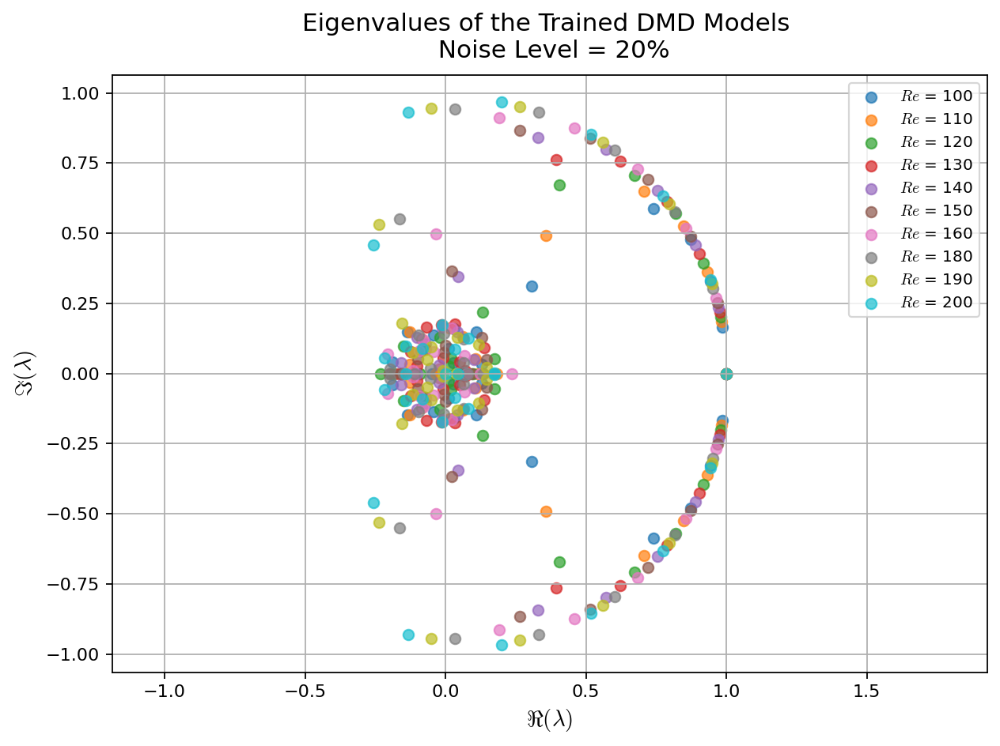

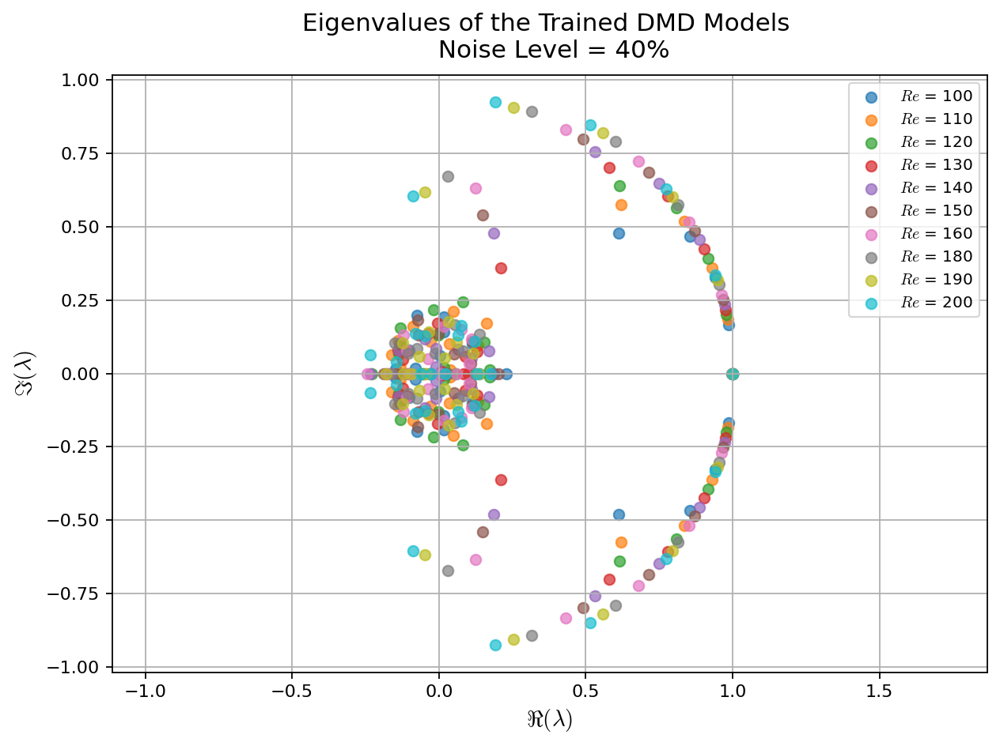

In [ ]:
# Visualize eigenvalue spectrum of trained DMD models

for nl in noise_levels:

    fig, ax = plt.subplots(figsize=(8, 6))

    # Disable Matplotlib's built‑in grid (it draws above lines)
    ax.grid(False)

    # Custom grid behind everything
    grid_vals = np.linspace(-1.2, 1.2, 13)
    for g in grid_vals:
        ax.plot([-1.2, 1.2], [g, g],
                color='lightgray', linewidth=0.6, zorder=0)
        ax.plot([g, g], [-1.2, 1.2],
                color='lightgray', linewidth=0.6, zorder=0)

    # Axes behind the circle
    ax.axhline(0, color='black', linewidth=0.8, zorder=0)
    ax.axvline(0, color='black', linewidth=0.8, zorder=0)

    # Unit circle (above grid, below markers)
    theta = np.linspace(0, 2*np.pi, 400)
    ax.plot(np.cos(theta), np.sin(theta),
            'k--', linewidth=1.2, zorder=1)

    # Plot eigenvalues
    pdmd = pdmd_models[nl]
    for i, dmd in enumerate(pdmd._dmd):
        eigs = dmd.eigs[:30]
        Re = Re_list[i]

        ax.scatter(
            np.real(eigs),
            np.imag(eigs),
            label=f"$Re$ = {Re}",
            alpha=1.0,
            s=50,
            zorder=5
        )

    # Formatting
    ax.set_xlabel(r"$\Re(\lambda)$", fontsize=13)
    ax.set_ylabel(r"$\Im(\lambda)$", fontsize=13)
    plt.title(f"Eigenvalues of the Trained DMD Models \n Noise Level = {nl}%", fontsize=14, pad=10)
    ax.set_xlim(-1.2, 1.2)
    ax.set_ylim(-1.2, 1.2)
    ax.set_aspect("equal")

    ax.legend(loc="best", fontsize=9)

    plt.tight_layout()
    plt.show()



Modal coefficient comparison for noise level 10%


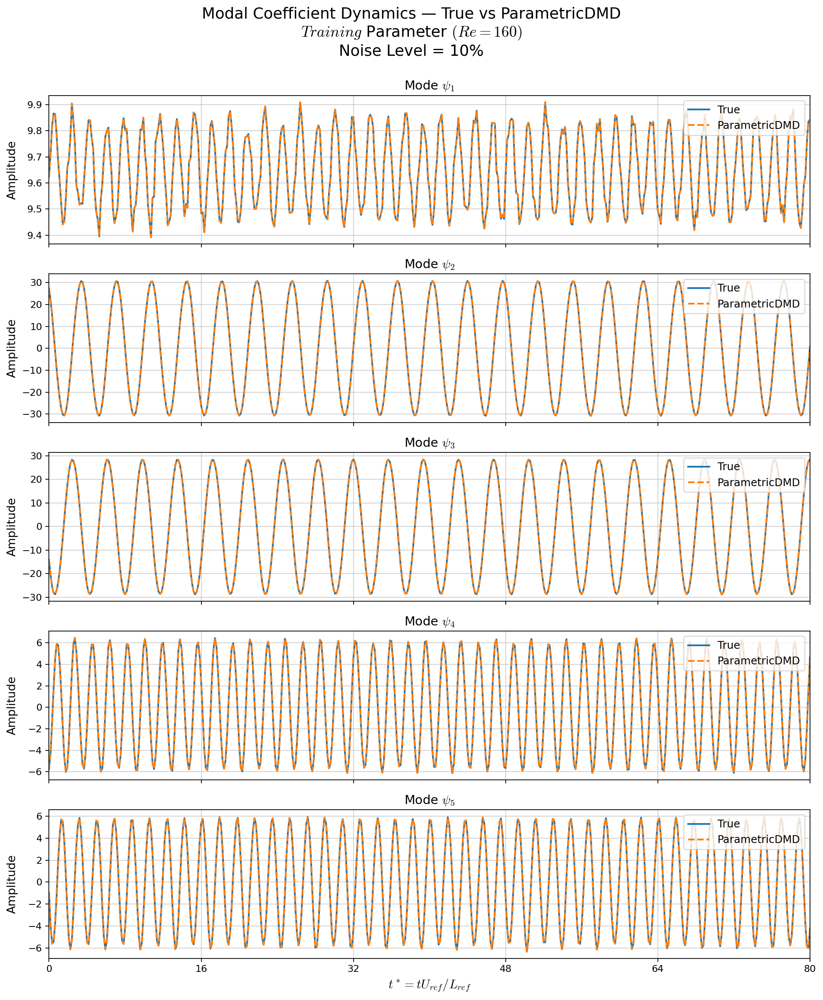


Modal coefficient comparison for noise level 20%


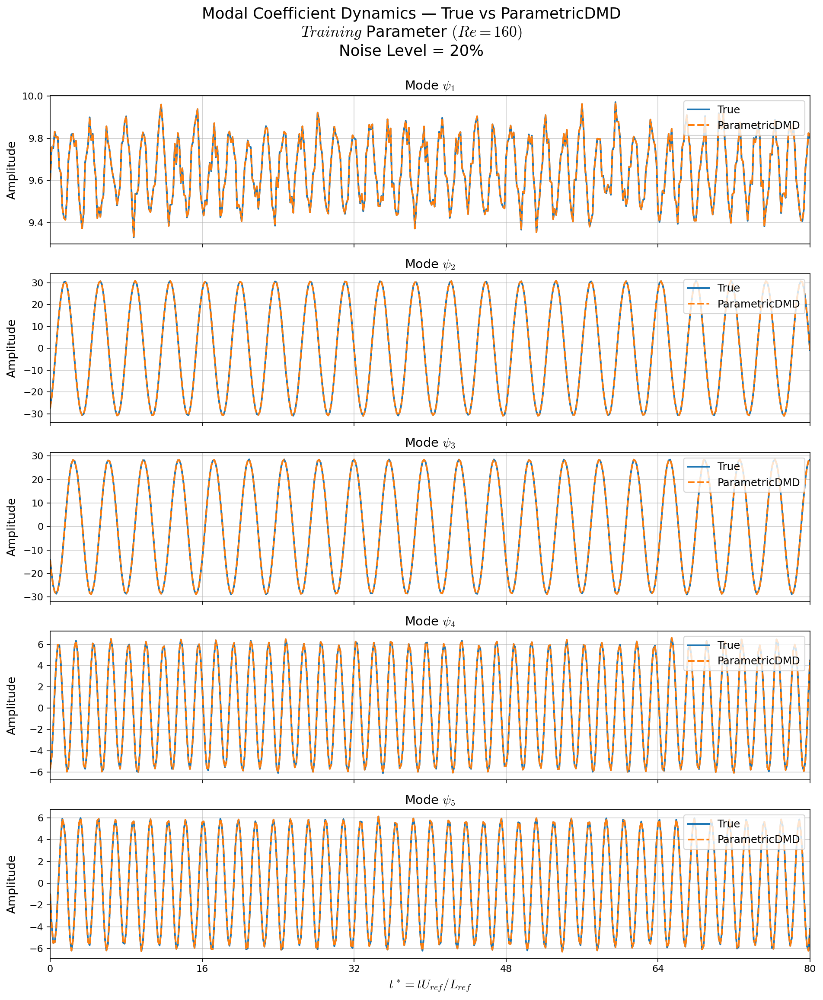


Modal coefficient comparison for noise level 40%


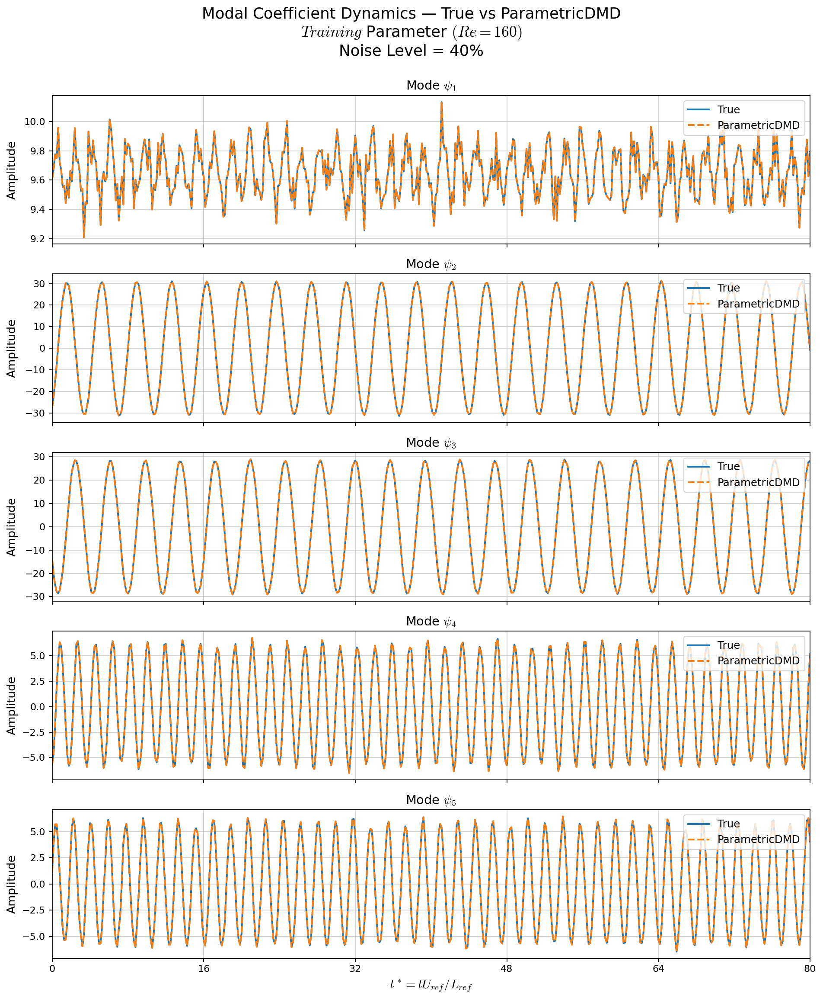

In [12]:
# Plot modal coefficients True vs ParametricDMD for a training parameter i.e., Reynolds number


from visualization_utilities_noise_analysis import plot_dmd_modal_comparison

Re_target = 160
n_modes_to_plot = 5

for nl in noise_levels:
    print(f"\nModal coefficient comparison for noise level {nl}%")

    plot_dmd_modal_comparison(
        pdmd=pdmd_models[nl],                                # PDMD for this noise level
        Re_list=Re_list,
        sampled_times_dict=sampled_times_dict,
        Re_value=Re_target,
        U_ref_dict=U_ref_dict,
        L_ref=L_ref,
        rom=rom_models[nl],                                  # ROM for this noise level
        snapshot_processed_dict=snapshot_noisy_processed_dict[nl],  # NOISY processed snapshots
        n_modes_to_plot=n_modes_to_plot,
        noise_level=nl
    )



FFT comparison for noise level 10%


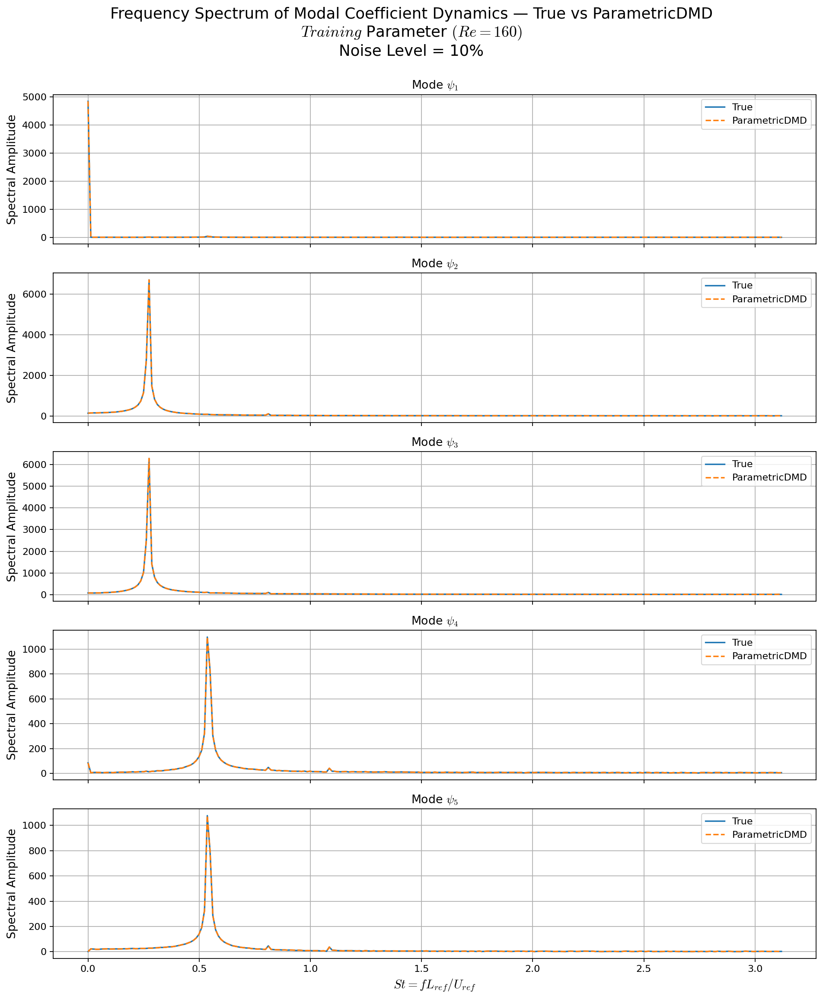


FFT comparison for noise level 20%


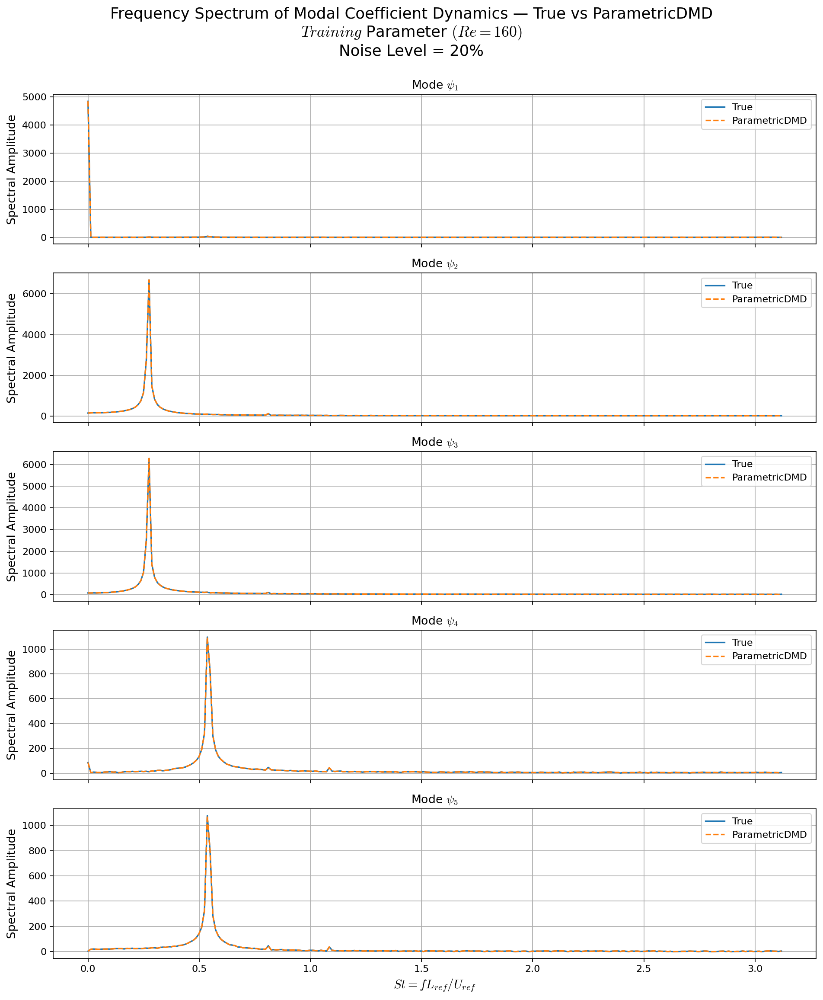


FFT comparison for noise level 40%


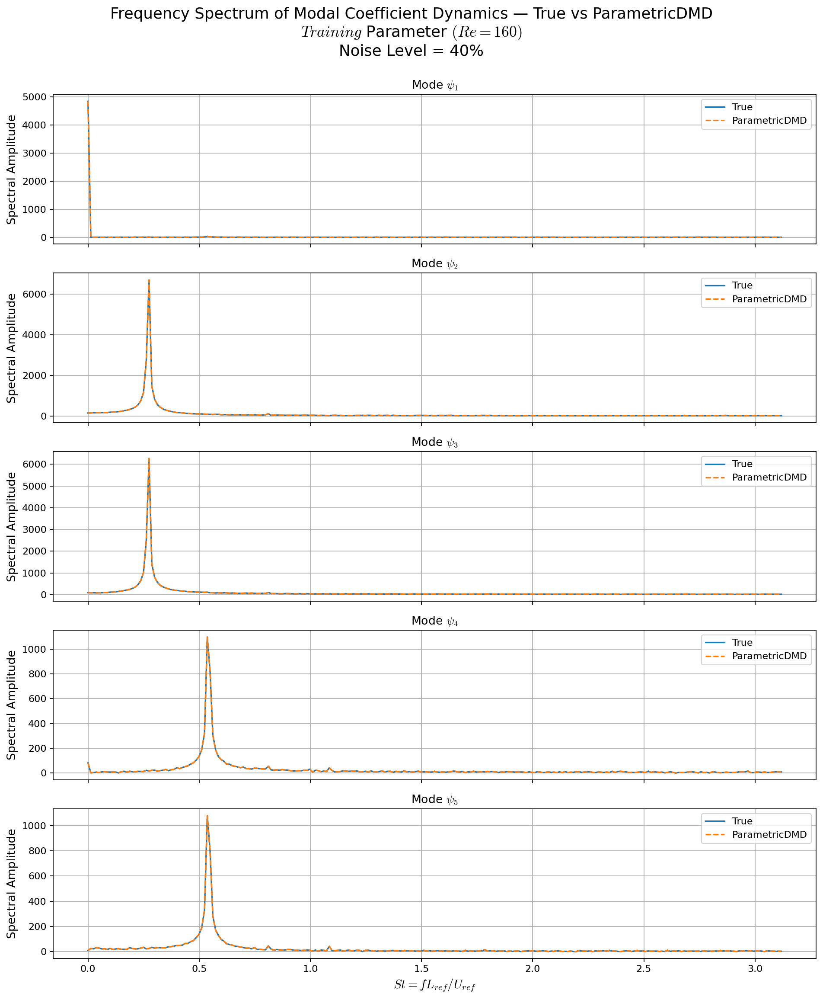

In [13]:
# Plot FFT of modal coefficients True vs ParametricDMD for a training parameter i.e., Reynolds number

from visualization_utilities_noise_analysis import plot_dmd_fft_comparison

Re_target = 160
n_plot = 5

for nl in noise_levels:
    print(f"\nFFT comparison for noise level {nl}%")

    plot_dmd_fft_comparison(
        pdmd=pdmd_models[nl],                                 # PDMD for this noise level
        Re_list=Re_list,
        Re_target=Re_target,
        L_ref=L_ref,
        nu=nu,
        n_plot=n_plot,
        snapshot_processed_dict=snapshot_noisy_processed_dict[nl], # NOISY processed snapshots
        sampled_times_dict=sampled_times_dict, 
        rom=rom_models[nl],                                   # ROM for this noise level
        noise_level=nl
    )



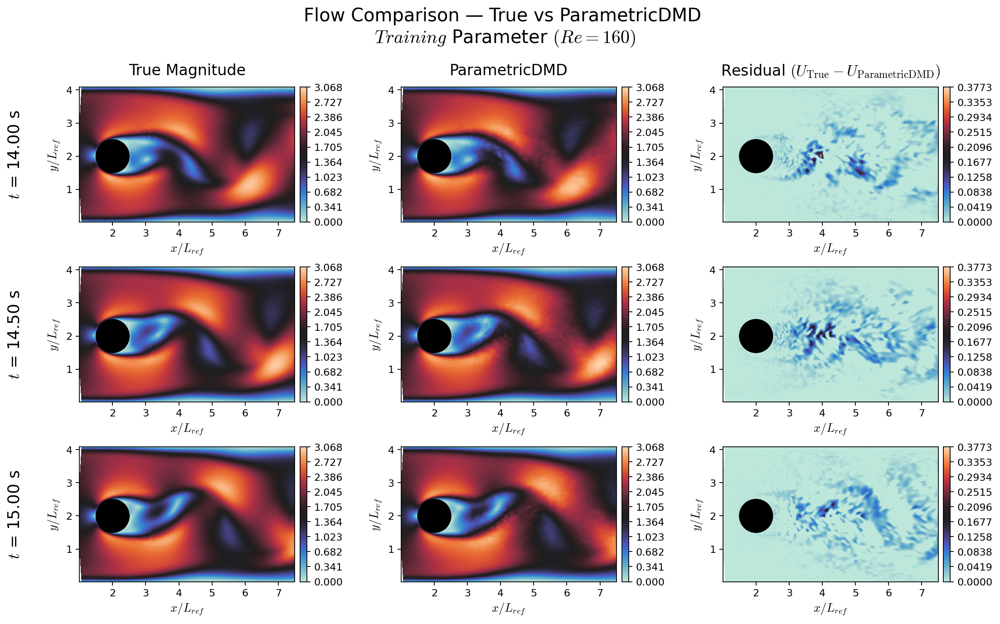

In [14]:
# Plot flow comparison True vs ParametricDMD for a training parameter i.e., Reynolds number

from visualization_utilities import plot_flow_comparison_dmd_vs_true


Re_target = 160
t_start = 14.0
t_end = 15.0
granularity = 0.5

noise_level_to_plot = 40   

plot_flow_comparison_dmd_vs_true(
    Re_target=Re_target,
    Re_list=Re_list,
    t_start=t_start,
    t_end=t_end,
    granularity=granularity,
    rom=rom_models[noise_level_to_plot],                         # ROM for this noise level
    pdmd=pdmd_models[noise_level_to_plot],                       # PDMD for this noise level
    mean_flow=mean_flow_noisy_dict[noise_level_to_plot],         # mean flow for this noise level
    sampled_times_dict=sampled_times_dict,
    snapshot_dict=snapshot_dict,       
    masked_coords_dict=masked_coords_dict,
    num_points_dict=num_points_dict,
    L_ref=L_ref,
    cylinderX=cylinderX,
    cylinderY=cylinderY,
    radius=radius,
    cmap='icefire'
)


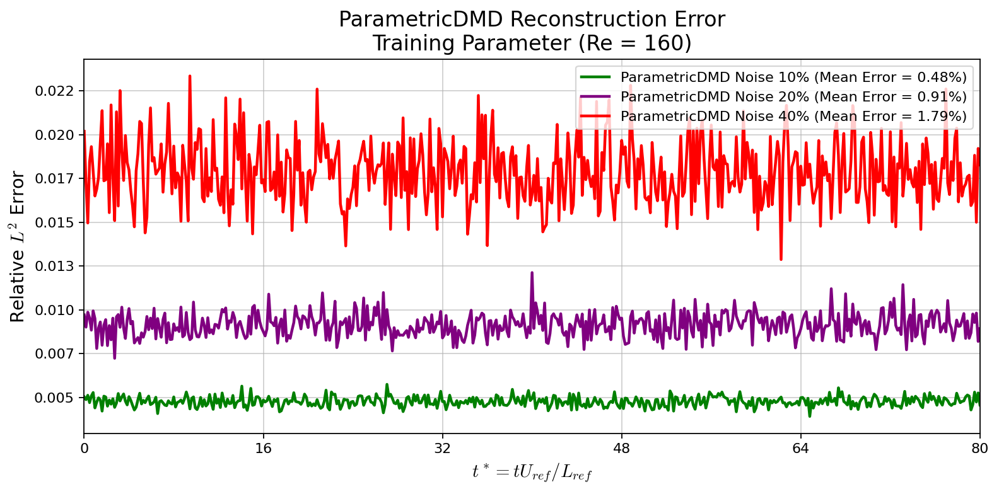

In [15]:
# Plot reconstruction error True vs ParametricDMD for a training parameter i.e., Reynolds number

from visualization_utilities_noise_analysis import plot_dmd_reconstruction_error_all_noises

Re_target = 160

plot_dmd_reconstruction_error_all_noises(
    pdmd_list=[pdmd_models[nl] for nl in noise_levels],
    rom_list=[rom_models[nl] for nl in noise_levels],
    mean_flow_train_list=[mean_flow_noisy_dict[nl] for nl in noise_levels],
    noise_levels=noise_levels,
    Re_target=Re_target,
    Re_list=Re_list,
    sampled_times_dict=sampled_times_dict,
    snapshot_dict=snapshot_dict,
    L_ref=L_ref,
    nu=nu,
    colors=["green", "purple", "red"] 
)


# Online phase

# Forecasting and interpolation

In [16]:
for nl in noise_levels:
    print(f"\n Forecasting for noise level {nl}% ")

    pdmd = pdmd_models[nl]   # PDMD for this noise level

    # Use sampled times from the first parameter in training list
    training_times = np.array(sampled_times_dict[Re_list[0]], dtype=float)

    # Define forecasting time range
    pdmd.dmd_time["t0"]   = pdmd.original_time["tend"]
    pdmd.dmd_time["tend"] = pdmd.original_time["tend"] + 500 - 1e-12
    pdmd.dmd_time["dt"]   = pdmd.original_time["dt"]

    # Set target parameter for interpolation
    pdmd.parameters = np.array([[Re_test]])

    # Trigger interpolated reconstruction
    interpolated_snapshots = pdmd.reconstructed_data
    interpolated_field = interpolated_snapshots[0]

    # Print physical time steps
    print(
        f"Forecasting from t = {pdmd.dmd_time['t0']} "
        f"to t = {pdmd.dmd_time['tend']} with Δt = {pdmd.dmd_time['dt']}"
    )
    print("Time vector:", pdmd.dmd_timesteps)



 Forecasting for noise level 10% 
Forecasting from t = 500 to t = 999.999999999999 with Δt = 1
Time vector: [ 500.  501.  502.  503.  504.  505.  506.  507.  508.  509.  510.  511.
  512.  513.  514.  515.  516.  517.  518.  519.  520.  521.  522.  523.
  524.  525.  526.  527.  528.  529.  530.  531.  532.  533.  534.  535.
  536.  537.  538.  539.  540.  541.  542.  543.  544.  545.  546.  547.
  548.  549.  550.  551.  552.  553.  554.  555.  556.  557.  558.  559.
  560.  561.  562.  563.  564.  565.  566.  567.  568.  569.  570.  571.
  572.  573.  574.  575.  576.  577.  578.  579.  580.  581.  582.  583.
  584.  585.  586.  587.  588.  589.  590.  591.  592.  593.  594.  595.
  596.  597.  598.  599.  600.  601.  602.  603.  604.  605.  606.  607.
  608.  609.  610.  611.  612.  613.  614.  615.  616.  617.  618.  619.
  620.  621.  622.  623.  624.  625.  626.  627.  628.  629.  630.  631.
  632.  633.  634.  635.  636.  637.  638.  639.  640.  641.  642.  643.
  644.  645.  6

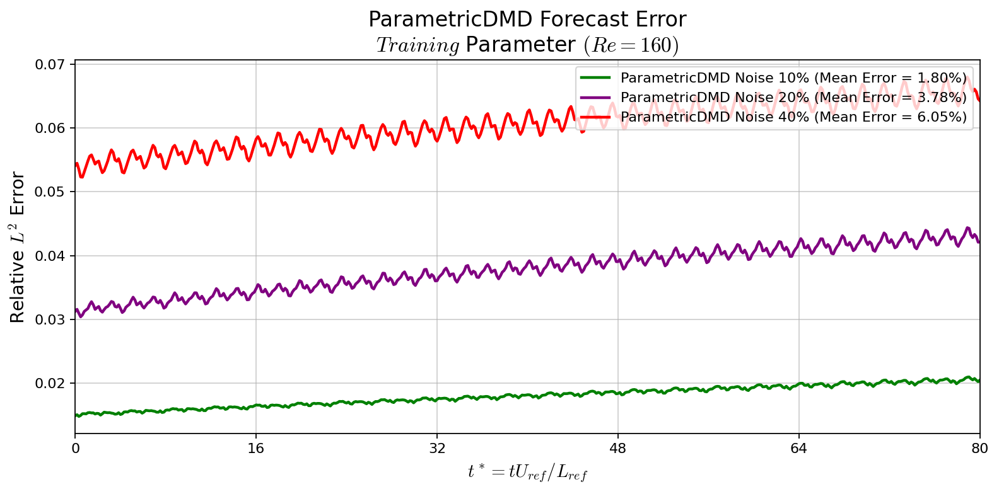

In [17]:
# Plot reconstruction error True vs Forecasted ParametricDMD for a training parameter i.e., Reynolds number

from visualization_utilities_noise_analysis import plot_dmd_forecast_error_all_noises

Re_target = 160

plot_dmd_forecast_error_all_noises(
    pdmd_list=[pdmd_models[nl] for nl in noise_levels],
    rom_list=[rom_models[nl] for nl in noise_levels],
    mean_flow_train_list=[mean_flow_noisy_dict[nl] for nl in noise_levels],
    noise_levels=noise_levels,
    Re_target=Re_target,
    Re_list=Re_list,
    sampled_times_future_dict=sampled_times_future_dict,
    snapshot_future_dict=snapshot_future_dict,
    L_ref=L_ref,
    nu=nu,
    colors=["green", "purple", "red"]
)






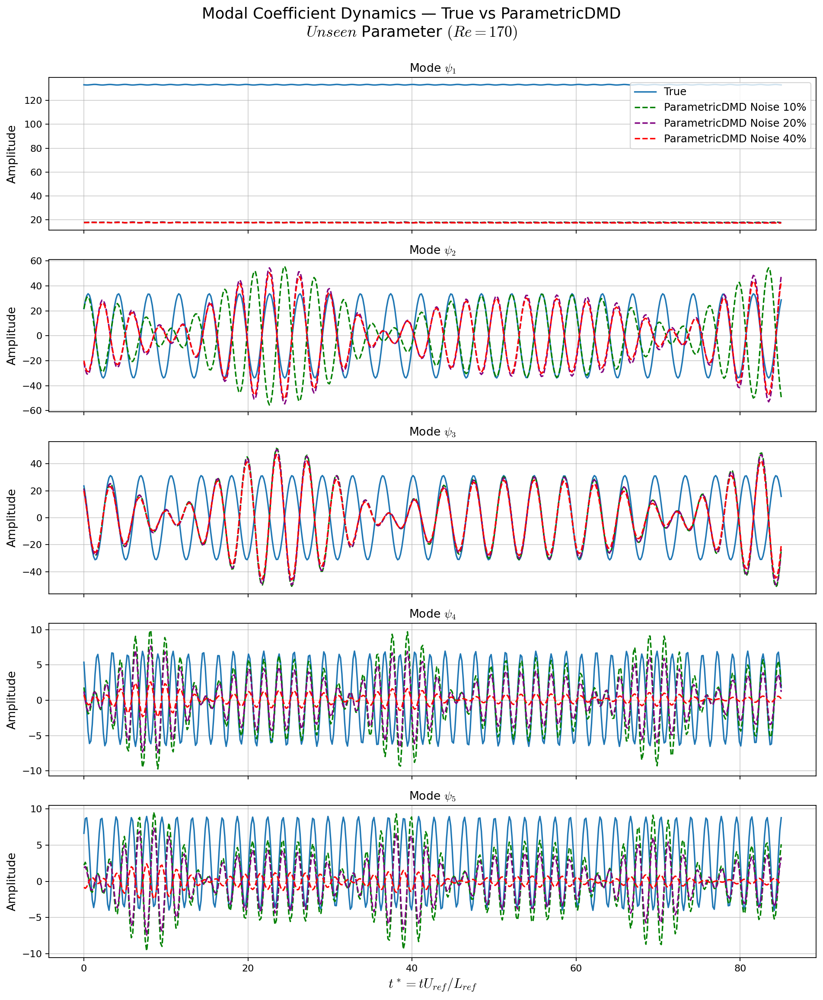

In [18]:
# Plot modal coefficients True vs Interpolated ParametricDMD for unseen parameter i.e., Reynolds number

from visualization_utilities_noise_analysis import plot_dmd_modal_comparison_interp_vs_true_all_noises

Re_test = 170
n_modes_to_plot = 5

plot_dmd_modal_comparison_interp_vs_true_all_noises(
        pdmd_list=[pdmd_models[nl] for nl in noise_levels],
        noise_levels=noise_levels,
        snapshot_test=snapshot_test,
        Re_test=Re_test,
        L_ref=L_ref,
        nu=nu,
        rom=rom_models[noise_levels[0]],   # any ROM is fine
        times_test=times_test,
        n_modes_to_plot=n_modes_to_plot
    )




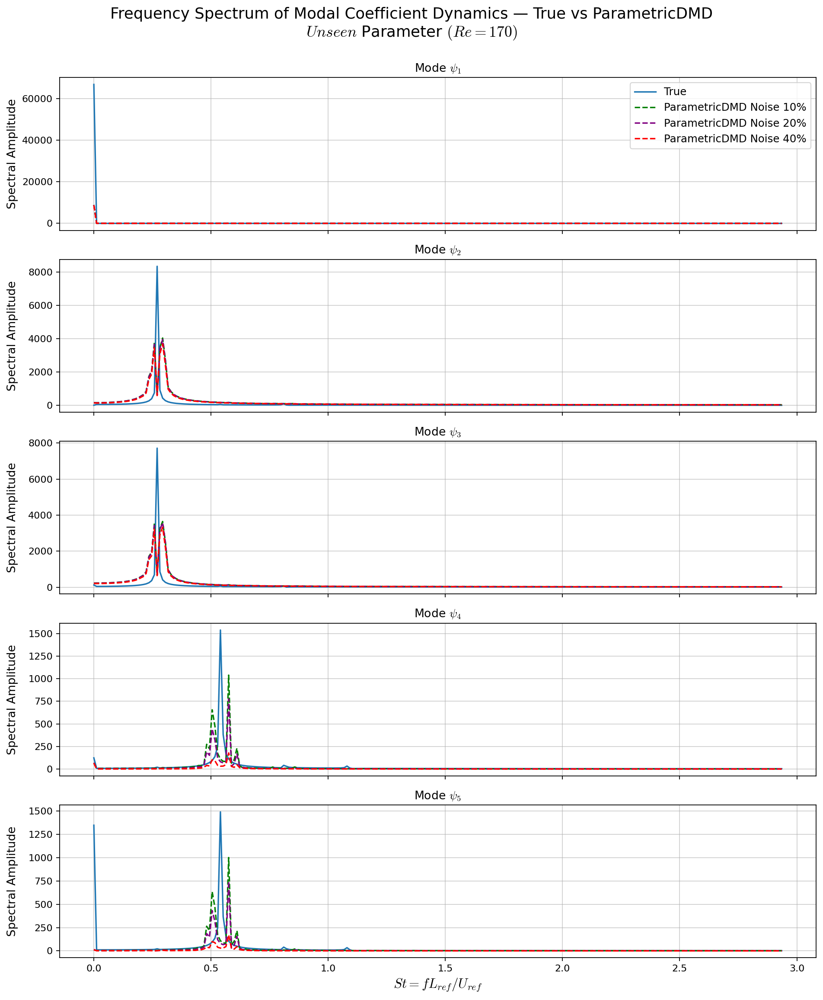

In [19]:
# Plot FFT of modal coefficients interpolated modal coefficients for unseen parameter i.e., Reynolds numbers

from visualization_utilities_noise_analysis import plot_dmd_fft_comparison_interp_vs_true_all_noises

n_modes_to_plot = 5
dt_phys = 0.01
t0_phys = 15.0

plot_dmd_fft_comparison_interp_vs_true_all_noises(
    pdmd_list=[pdmd_models[nl] for nl in noise_levels],   # all PDMD models
    noise_levels=noise_levels,
    snapshot_test=snapshot_test,
    Re_test=Re_test,
    L_ref=L_ref,
    nu=nu,
    rom=rom_models[noise_levels[0]],     # pick ANY ROM (same POD basis)
    times_test=times_test,
    n_modes_to_plot=n_modes_to_plot
)





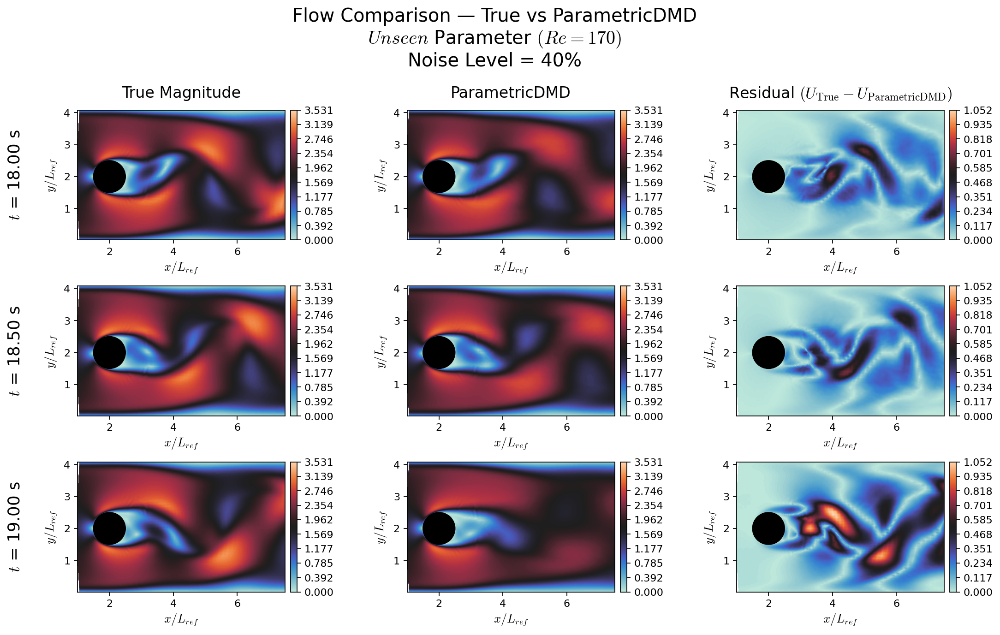

In [20]:
# Plot flow comparison true vs interpolated ParametricDMD for unseen parameter i.e., Reynolds number
from visualization_utilities_noise_analysis import plot_flow_comparison_interpolated_dmd_vs_true

t_start = 18.0
t_end = 19.0
granularity = 0.5
noise_level_to_plot = 40   # choose the noise level

plot_flow_comparison_interpolated_dmd_vs_true(
    pdmd=pdmd_models[noise_level_to_plot],                      # PDMD for this noise level
    snapshot_test=snapshot_test,                    
    sampled_times_test=times_test,
    loader_test=loader_test, 
    mask_test=mask_test,
    num_points_test=num_points_test,
    mean_flow_train=mean_flow_noisy_dict[noise_level_to_plot],  # mean flow for this noise level
    Re_test=Re_test,
    t_start=t_start,
    t_end=t_end,
    granularity=granularity,
    L_ref=0.1,
    cmap="icefire",
    noise_level=nl
)



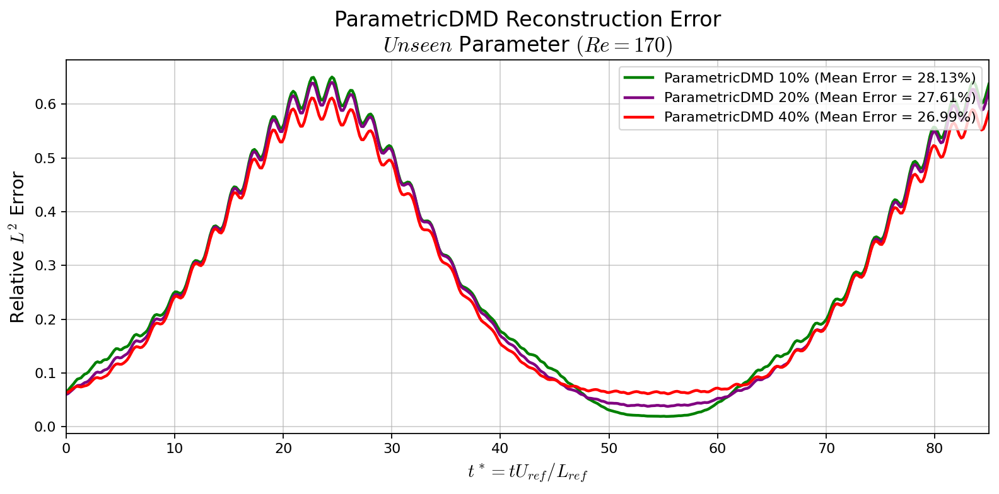

In [21]:
# Plot interpolation reconstruction error unseen parameter i.e., Reynolds number

from visualization_utilities_noise_analysis import plot_interp_reconstruction_error

plot_interp_reconstruction_error(
    snapshot_test,
    times_test,
    pdmd_dict=pdmd_models,
    Re_test=Re_test,
    mean_flow_train_dict=mean_flow_noisy_dict,
    L_ref=L_ref,
    nu=nu,
    noise_levels=noise_levels,
    colors=colors
)




